In [4]:
# Load required libraries
import numpy as np
from scipy.io import loadmat
from scipy.signal import hilbert
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
import seaborn as sns
from neurodsp.filt import filter_signal, filter_signal_fir, design_fir_filter
import emd
import pandas as pd
from sklearn.preprocessing import Normalizer
from tqdm import tqdm
import plotly.express as px
import copy
import umap.umap_ as umap
from scipy.spatial import cKDTree
import pickle

# Import custom functions
from scripts.functions import *
from scripts.structure_index import compute_structure_index, draw_graph

sns.set(style='white', context='notebook')

## Load Data

In [ ]:
Rat1_data_pfc = pd.read_hdf('./cycles_data/PFC_resampled_cycles_data.h5', f'Rat_1_OR_N')
orn1_metrics = Rat1_data_pfc.iloc[:, :-128]
orn1_waveforms = np.array(Rat1_data_pfc.iloc[:, -128:])

Rat4_data_pfc = pd.read_hdf('./cycles_data/PFC_resampled_cycles_data.h5', f'Rat_4_OR_N')
orn4_metrics = Rat4_data_pfc.iloc[:, :-128]
orn4_waveforms = np.array(Rat4_data_pfc.iloc[:, -128:])

Rat13_data_pfc = pd.read_hdf('./cycles_data/PFC_resampled_cycles_data.h5', f'Rat_13_OR_N')
orn13_metrics = Rat13_data_pfc.iloc[:, :-128]
orn13_waveforms = np.array(Rat13_data_pfc.iloc[:, -128:])

## Intrinsic Dimension and UMAP

In [19]:
ID = np.round(np.nanmean(abids(orn1_waveforms, 50)))
ID

4.0

In [151]:
umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=4, metric='euclidean', random_state=42)
embedding = umap_embedder.fit(orn1_waveforms)
emb_orn1 = embedding.embedding_

umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=4, metric='euclidean', random_state=42)
embedding = umap_embedder.fit(orn4_waveforms)
emb_orn4 = embedding.embedding_

umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=3, metric='euclidean', random_state=42)
embedding = umap_embedder.fit(orn13_waveforms)
emb_orn13 = embedding.embedding_

### UMAP Plots

In [ ]:
data = orn1_metrics

f, ax = plt.subplots(3,3, figsize=(25,20))
s = ax[0,0].scatter(emb[:,0], emb[:,1], c=data['peak_values'],
            vmin=np.percentile(data['peak_values'],1),
            vmax=np.percentile(data['peak_values'],99),
            cmap='coolwarm', s=50)
ax[0,0].set_xlabel('UMAP-1', fontsize=16)
ax[0,0].set_ylabel('UMAP-2', fontsize=16)
ax[0,0].set_title('peak_values', fontsize=16)
f.colorbar(s, ax=ax[0,0])

s = ax[0,1].scatter(emb[:,0], emb[:,1], c=data['trough_values'],
            vmin=np.percentile(data['trough_values'],1),
            vmax=np.percentile(data['trough_values'],99),
            cmap='coolwarm', s=50)
ax[0,1].set_xlabel('UMAP-1', fontsize=16)
ax[0,1].set_ylabel('UMAP-2', fontsize=16)
ax[0,1].set_title('trough_values', fontsize=16)
f.colorbar(s, ax=ax[0,1])

s = ax[0,2].scatter(emb[:,0], emb[:,1], c=data['duration_samples'],
            vmin=np.percentile(data['duration_samples'],1),
            vmax=np.percentile(data['duration_samples'],99),
            cmap='coolwarm', s=50)
ax[0,2].set_xlabel('UMAP-1', fontsize=16)
ax[0,2].set_ylabel('UMAP-2', fontsize=16)
ax[0,2].set_title('duration_samples', fontsize=16)
f.colorbar(s, ax=ax[0,2])
####################################################################

s = ax[1,0].scatter(emb[:,0], emb[:,2], c=data['peak_values'],
            vmin=np.percentile(data['peak_values'],1),
            vmax=np.percentile(data['peak_values'],99),
            cmap='coolwarm', s=50)
ax[1,0].set_xlabel('UMAP-1', fontsize=16)
ax[1,0].set_ylabel('UMAP-3', fontsize=16)
ax[1,0].set_title('peak_values', fontsize=16)
f.colorbar(s, ax=ax[1,0])

s = ax[1,1].scatter(emb[:,0], emb[:,2], c=data['trough_values'],
            vmin=np.percentile(data['trough_values'],1),
            vmax=np.percentile(data['trough_values'],99),
            cmap='coolwarm', s=50)
ax[1,1].set_xlabel('UMAP-1', fontsize=16)
ax[1,1].set_ylabel('UMAP-3', fontsize=16)
ax[1,1].set_title('trough_values', fontsize=16)
f.colorbar(s, ax=ax[1,1])

s = ax[1,2].scatter(emb[:,0], emb[:,2], c=data['duration_samples'],
            vmin=np.percentile(data['duration_samples'],1),
            vmax=np.percentile(data['duration_samples'],99),
            cmap='coolwarm', s=50)
ax[1,2].set_xlabel('UMAP-1', fontsize=16)
ax[1,2].set_ylabel('UMAP-3', fontsize=16)
ax[1,2].set_title('duration_samples', fontsize=16)
f.colorbar(s, ax=ax[1,2])
####################################################################

s = ax[2,0].scatter(emb[:,0], emb[:,3], c=data['peak_values'],
            vmin=np.percentile(data['peak_values'],1),
            vmax=np.percentile(data['peak_values'],99),
            cmap='coolwarm', s=50)
ax[2,0].set_xlabel('UMAP-1', fontsize=16)
ax[2,0].set_ylabel('UMAP-4', fontsize=16)
ax[2,0].set_title('peak_values', fontsize=16)
f.colorbar(s, ax=ax[2,0])

s = ax[2,1].scatter(emb[:,0], emb[:,3], c=data['trough_values'],
            vmin=np.percentile(data['trough_values'],1),
            vmax=np.percentile(data['trough_values'],99),
            cmap='coolwarm', s=50)
ax[2,1].set_xlabel('UMAP-1', fontsize=16)
ax[2,1].set_ylabel('UMAP-4', fontsize=16)
ax[2,1].set_title('trough_values', fontsize=16)
f.colorbar(s, ax=ax[2,1])

s = ax[2,2].scatter(emb[:,0], emb[:,3], c=data['duration_samples'],
            vmin=np.percentile(data['duration_samples'],1),
            vmax=np.percentile(data['duration_samples'],99),
            cmap='coolwarm', s=50)
ax[2,2].set_xlabel('UMAP-1', fontsize=16)
ax[2,2].set_ylabel('UMAP-4', fontsize=16)
ax[2,2].set_title('duration_samples', fontsize=16)
f.colorbar(s, ax=ax[2,2])
####################################################################

plt.suptitle("OR_N data", fontsize=24);
f.tight_layout()

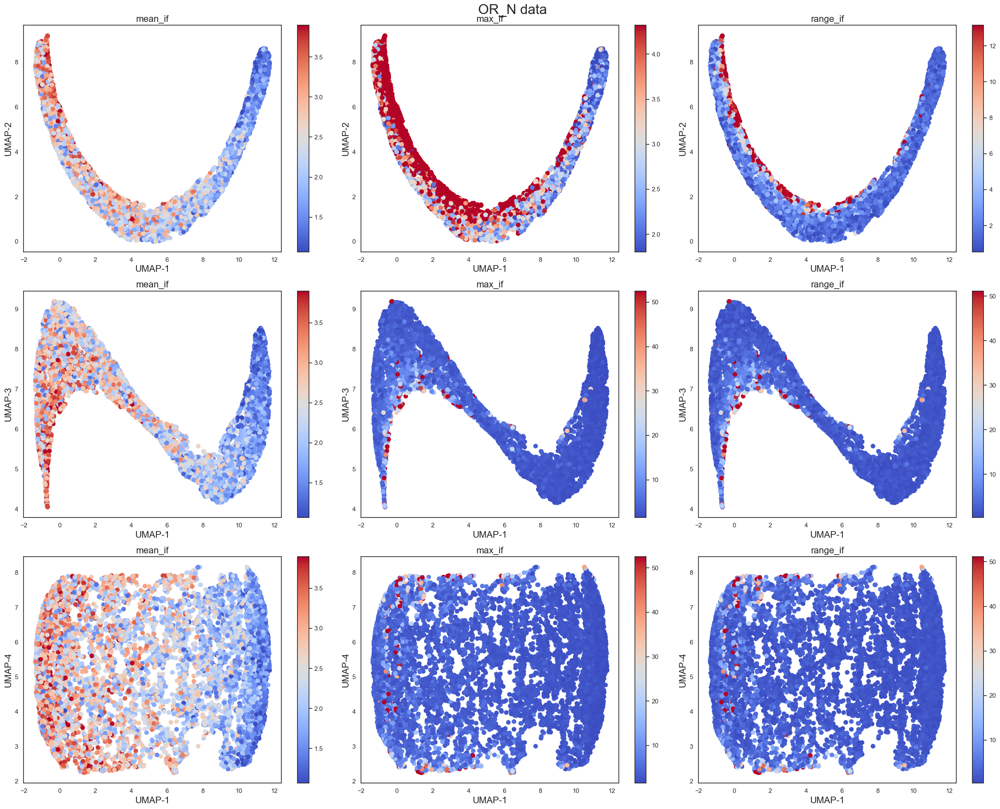

In [25]:
data = orn1_metrics

f, ax = plt.subplots(3,3, figsize=(25,20))
s = ax[0,0].scatter(emb[:,0], emb[:,1], c=data['mean_if'],
            vmin=np.percentile(data['mean_if'],1),
            vmax=np.percentile(data['mean_if'],99),
            cmap='coolwarm', s=50)
ax[0,0].set_xlabel('UMAP-1', fontsize=16)
ax[0,0].set_ylabel('UMAP-2', fontsize=16)
ax[0,0].set_title('mean_if', fontsize=16)
f.colorbar(s, ax=ax[0,0])

s = ax[0,1].scatter(emb[:,0], emb[:,1], c=data['max_if'],
            vmin=np.percentile(data['max_if'],5),
            vmax=np.percentile(data['max_if'],70),
            cmap='coolwarm', s=50)
ax[0,1].set_xlabel('UMAP-1', fontsize=16)
ax[0,1].set_ylabel('UMAP-2', fontsize=16)
ax[0,1].set_title('max_if', fontsize=16)
f.colorbar(s, ax=ax[0,1])

s = ax[0,2].scatter(emb[:,0], emb[:,1], c=data['range_if'],
            vmin=np.percentile(data['range_if'],5),
            vmax=np.percentile(data['range_if'],95),
            cmap='coolwarm', s=50)
ax[0,2].set_xlabel('UMAP-1', fontsize=16)
ax[0,2].set_ylabel('UMAP-2', fontsize=16)
ax[0,2].set_title('range_if', fontsize=16)
f.colorbar(s, ax=ax[0,2])
####################################################################

s = ax[1,0].scatter(emb[:,0], emb[:,2], c=data['mean_if'],
            vmin=np.percentile(data['mean_if'],1),
            vmax=np.percentile(data['mean_if'],99),
            cmap='coolwarm', s=50)
ax[1,0].set_xlabel('UMAP-1', fontsize=16)
ax[1,0].set_ylabel('UMAP-3', fontsize=16)
ax[1,0].set_title('mean_if', fontsize=16)
f.colorbar(s, ax=ax[1,0])

s = ax[1,1].scatter(emb[:,0], emb[:,2], c=data['max_if'],
            vmin=np.percentile(data['max_if'],1),
            vmax=np.percentile(data['max_if'],99),
            cmap='coolwarm', s=50)
ax[1,1].set_xlabel('UMAP-1', fontsize=16)
ax[1,1].set_ylabel('UMAP-3', fontsize=16)
ax[1,1].set_title('max_if', fontsize=16)
f.colorbar(s, ax=ax[1,1])

s = ax[1,2].scatter(emb[:,0], emb[:,2], c=data['range_if'],
            vmin=np.percentile(data['range_if'],1),
            vmax=np.percentile(data['range_if'],99),
            cmap='coolwarm', s=50)
ax[1,2].set_xlabel('UMAP-1', fontsize=16)
ax[1,2].set_ylabel('UMAP-3', fontsize=16)
ax[1,2].set_title('range_if', fontsize=16)
f.colorbar(s, ax=ax[1,2])
####################################################################

s = ax[2,0].scatter(emb[:,0], emb[:,3], c=data['mean_if'],
            vmin=np.percentile(data['mean_if'],1),
            vmax=np.percentile(data['mean_if'],99),
            cmap='coolwarm', s=50)
ax[2,0].set_xlabel('UMAP-1', fontsize=16)
ax[2,0].set_ylabel('UMAP-4', fontsize=16)
ax[2,0].set_title('mean_if', fontsize=16)
f.colorbar(s, ax=ax[2,0])

s = ax[2,1].scatter(emb[:,0], emb[:,3], c=data['max_if'],
            vmin=np.percentile(data['max_if'],1),
            vmax=np.percentile(data['max_if'],99),
            cmap='coolwarm', s=50)
ax[2,1].set_xlabel('UMAP-1', fontsize=16)
ax[2,1].set_ylabel('UMAP-4', fontsize=16)
ax[2,1].set_title('max_if', fontsize=16)
f.colorbar(s, ax=ax[2,1])

s = ax[2,2].scatter(emb[:,0], emb[:,3], c=data['range_if'],
            vmin=np.percentile(data['range_if'],1),
            vmax=np.percentile(data['range_if'],99),
            cmap='coolwarm', s=50)
ax[2,2].set_xlabel('UMAP-1', fontsize=16)
ax[2,2].set_ylabel('UMAP-4', fontsize=16)
ax[2,2].set_title('range_if', fontsize=16)
f.colorbar(s, ax=ax[2,2])
####################################################################

plt.suptitle("OR_N data", fontsize=24);
f.tight_layout()

In [37]:
random_indexes = np.random.choice(range(len(emb[:,0])), size=10000)

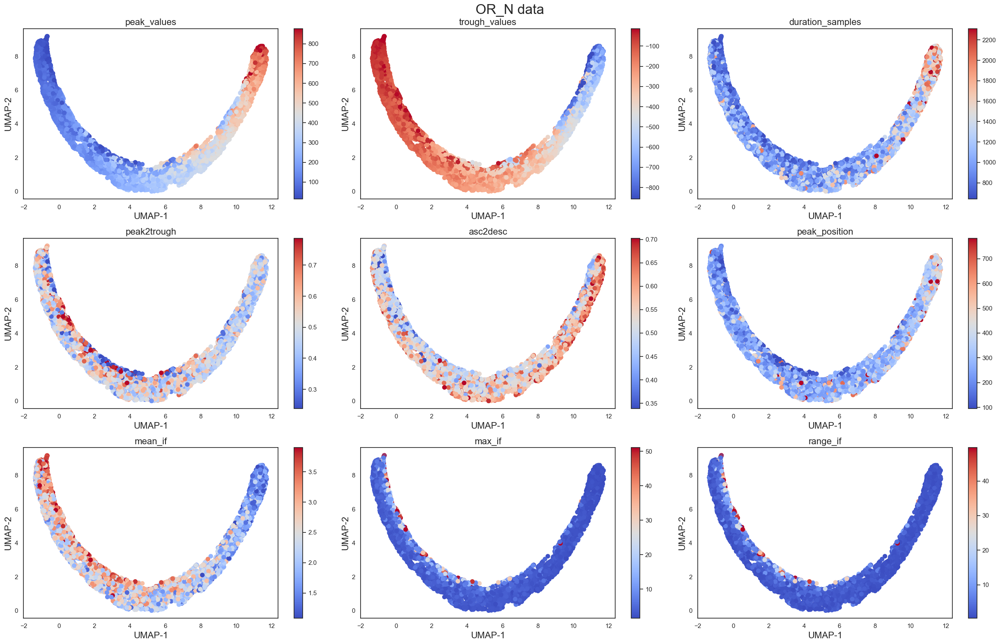

In [43]:
data = orn_data['ORN1_trials']

f, ax = plt.subplots(3,3, figsize=(25,16))

features = ['peak_values','trough_values','duration_samples', 'peak2trough', 'asc2desc', 'peak_position', 'mean_if', 'max_if','range_if']
feature_iter = iter(features)

for r in range(3):
    for c in range(3):
        feature = next(feature_iter)
        s = ax[r,c].scatter(emb[:,0][random_indexes], emb[:,1][random_indexes], c=data[feature].iloc[random_indexes],
            vmin=np.percentile(data[feature].iloc[random_indexes],1),
            vmax=np.percentile(data[feature].iloc[random_indexes],99),
            cmap='coolwarm', s=50)
        ax[r,c].set_xlabel('UMAP-1', fontsize=16)
        ax[r,c].set_ylabel('UMAP-2', fontsize=16)
        ax[r,c].set_title(feature, fontsize=16)
        f.colorbar(s, ax=ax[r,c])

plt.suptitle("OR_N data", fontsize=24);
f.tight_layout()

### Waveforms

In [47]:
emb_data = pd.DataFrame(embedding.embedding_)
component = 1

In [51]:
data = orn1_metrics

low_embeddings = emb_data[(emb_data[component-1] >= np.percentile(emb_data[component-1], 0)) & (emb_data[component-1] <= np.percentile(emb_data[component-1], 20))]
low_waveforms = np.array(pd.DataFrame(waveforms).iloc[low_embeddings.index])

high_embeddings = emb_data[(emb_data[component-1] >= np.percentile(emb_data[component-1], 80)) & (emb_data[component-1] <= np.percentile(emb_data[component-1], 100))]
high_waveforms = np.array(pd.DataFrame(waveforms).iloc[high_embeddings.index])

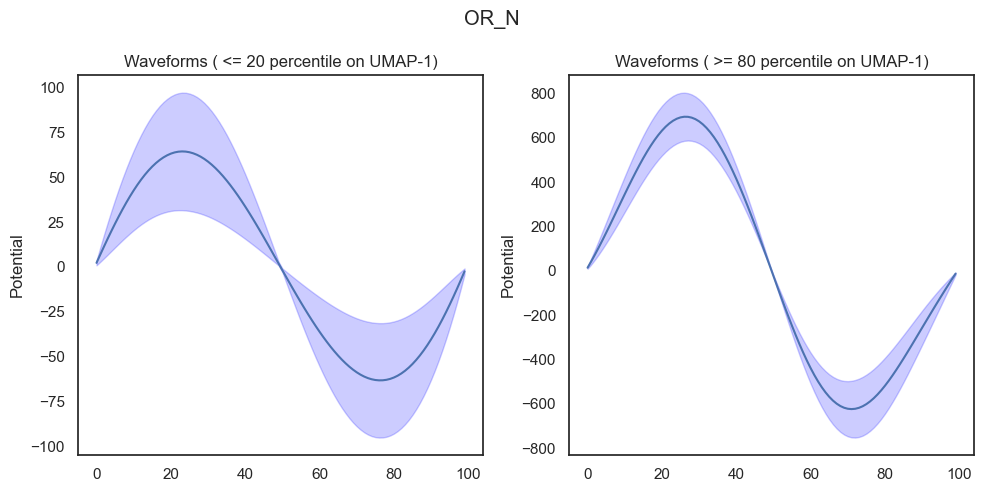

In [57]:
# Average waveforms
plt.figure(figsize=(10,5), facecolor='white')
plt.suptitle("OR_N")
plt.subplot(1, 2, 1)

means = np.mean(low_waveforms, axis=0)
x_values = np.arange(len(means))
std = np.std(low_waveforms, axis=0)
lower_bound = np.array(means) - np.array(std)
upper_bound = np.array(means) + np.array(std)
sns.lineplot(means)
plt.fill_between(x_values, lower_bound, upper_bound, color='blue', alpha=0.2)
plt.ylabel('Potential')
plt.title(f'Waveforms ( <= 20 percentile on UMAP-{component})');

plt.subplot(1, 2, 2)
means = np.mean(high_waveforms, axis=0)
std = np.std(high_waveforms, axis=0)
lower_bound = np.array(means) - np.array(std)
upper_bound = np.array(means) + np.array(std)
sns.lineplot(means)
plt.fill_between(x_values, lower_bound, upper_bound, color='blue', alpha=0.2);
plt.ylabel('Potential')
plt.title(f'Waveforms ( >= 80 percentile on UMAP-{component})');
plt.tight_layout()

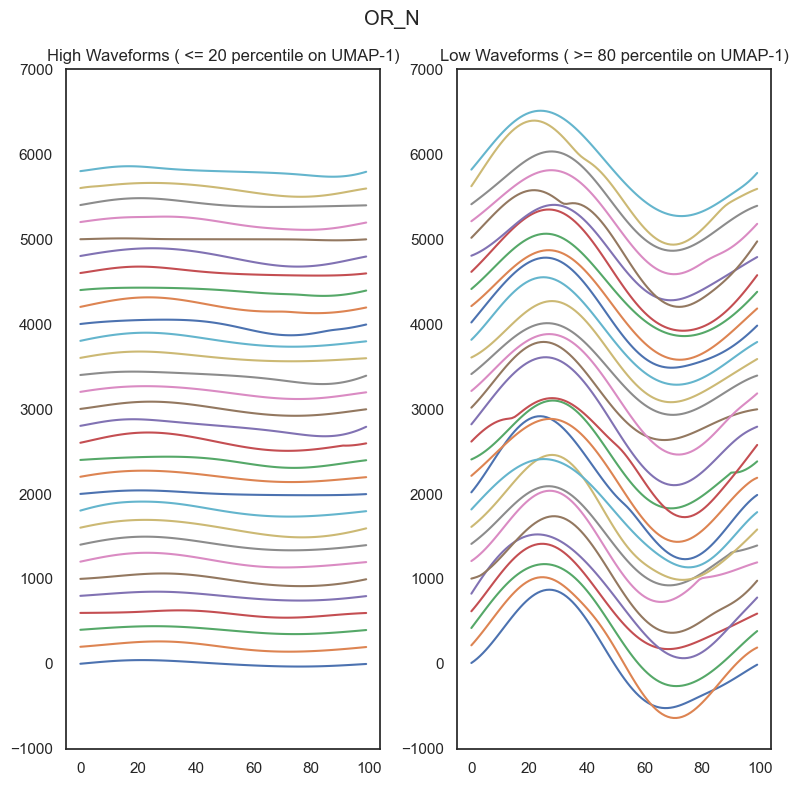

In [59]:
plt.figure(figsize=(8,8), facecolor='white')
plt.suptitle("OR_N")
plt.subplot(1, 2, 1)
plt.title(f'High Waveforms ( <= 20 percentile on UMAP-{component})')
start = 0
cycles_to_plot = np.random.randint(1, low_waveforms.shape[0], 30)
for i in cycles_to_plot:
  plt.plot(low_waveforms[i,:]+start)
  start += 200
plt.ylim((-1000, 7000))

plt.subplot(1, 2, 2)
plt.title(f'Low Waveforms ( >= 80 percentile on UMAP-{component})')
start = 0
cycles_to_plot = np.random.randint(1, high_waveforms.shape[0], 30)
for i in cycles_to_plot:
  plt.plot(high_waveforms[i,:]+start)
  start += 200
plt.ylim((-1000, 7000))

plt.tight_layout()

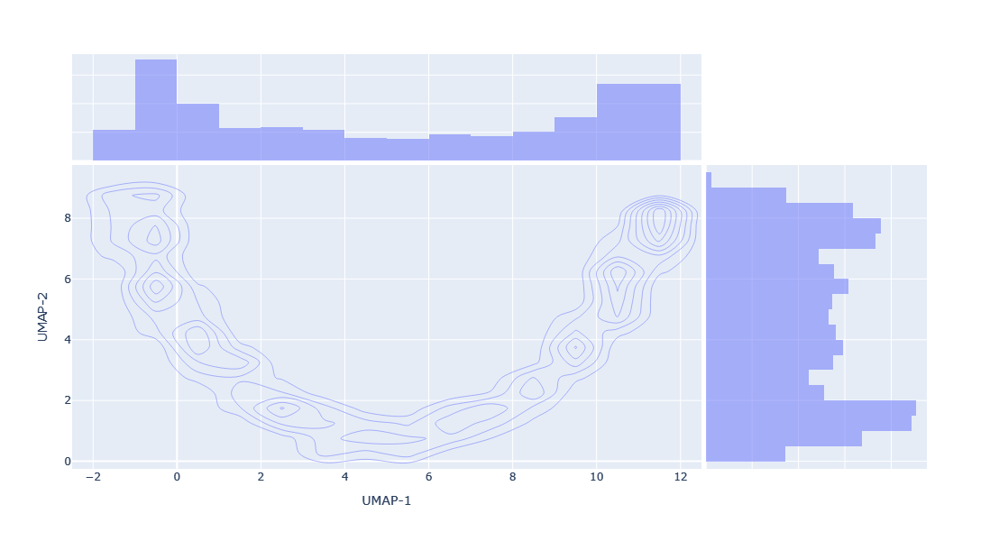

In [61]:
fig = px.density_contour(x=emb[:, 0], y=emb[:, 1], marginal_x="histogram", marginal_y="histogram")
fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    xaxis_title="UMAP-1", yaxis_title="UMAP-2"
)
fig.show()

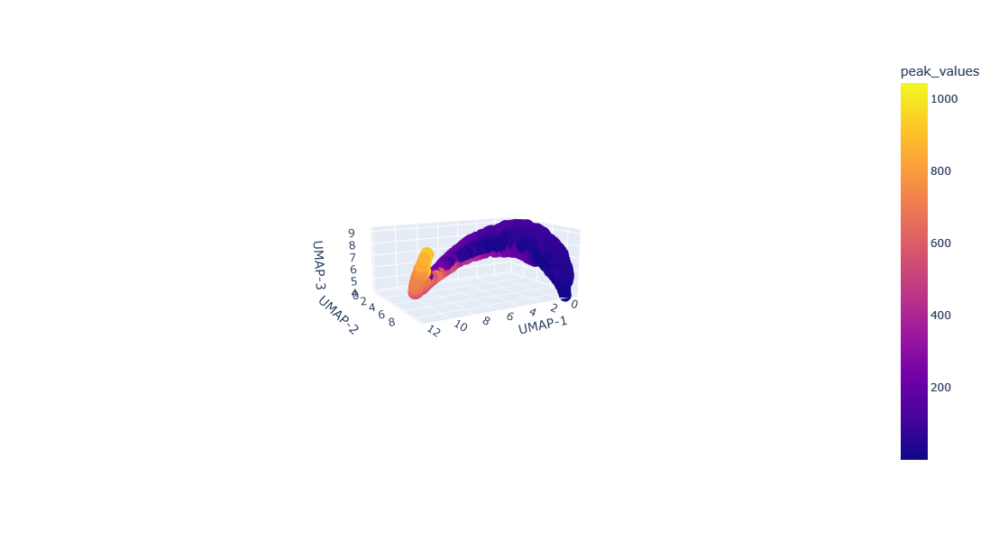

In [75]:
from plotly.graph_objs.layout import Scene
from plotly.graph_objs.layout.scene import XAxis, YAxis, ZAxis

fig = px.scatter_3d(x=emb[:,0], y=emb[:,1], z=emb[:,2],
              color=data['peak_values'])
fig.update_layout(coloraxis_colorbar_title_text = 'peak_values',
                 autosize=False,
                 width=800,
                 height=600,
                 scene=Scene(xaxis=XAxis(title='UMAP-1'),
                            yaxis=YAxis(title='UMAP-2'),
                            zaxis=ZAxis(title='UMAP-3')))
fig.show()

# Structure Index

## Align the data

In [179]:
def align(data, feature, template_data, template_feature):
    params = {
        'n_bins': 15,
        'n_neighbors': 15,
        'discrete_label': False,
        'num_shuffles': 10,
        'verbose': False,
    }

    SI_1, binLabel_1, overlapMat_1, sSI_1 = compute_structure_index(data, np.array(feature), **params)
    SI_2, binLabel_2, overlapMat_2, sSI_2 = compute_structure_index(template_data, np.array(template_feature), **params)

    centroids_1 = []
    for i in range(params['n_bins']):
        centroid = np.mean(data[binLabel_1[0] == i], axis=0)
        centroids_1.append(centroid)
    centroids_1 = np.array(centroids_1)
    
    centroids_2 = []
    for i in range(params['n_bins']):
        centroid = np.mean(template_data[binLabel_2[0] == i], axis=0)
        centroids_2.append(centroid)
    centroids_2 = np.array(centroids_2)
    
    centroids_1_mean = np.mean(centroids_1, axis=0)
    centroids_2_mean = np.mean(centroids_2, axis=0)
    centroids_1 = centroids_1 - centroids_1_mean
    centroids_2 = centroids_2 - centroids_2_mean

    H = np.dot(centroids_2.T, centroids_1)
    U, S, Vh = np.linalg.svd(H, full_matrices=True)
    
    R = np.dot(U, Vh)
    if np.linalg.det(R) < 0:
        Vh[Vh.shape[0]-1, :] = Vh[Vh.shape[0]-1, :] * (-1)
        R = np.dot(U, Vh)
    T = centroids_2_mean - np.dot(centroids_1_mean, R)
    new_data = np.dot(data, R) + T
    return new_data

In [181]:
emb_orn4 = align(emb_orn4, orn1_metrics['peak_values'], emb_orn1, orn1_metrics['peak_values'])

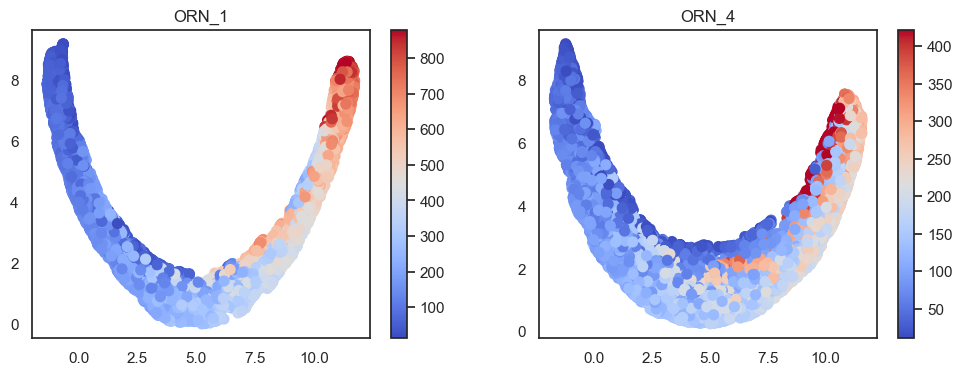

In [183]:
plt.subplots(1,2,figsize=(12,4))

plt.subplot(1,2,1)
plt.scatter(emb_orn1[:,0], emb_orn1[:,1], c=orn1_trials['peak_values'],
            vmin=np.percentile(orn1_trials['peak_values'],1),
            vmax=np.percentile(orn1_trials['peak_values'],99),
            cmap='coolwarm', s=50)
# plt.xlim(-2.5, 12)
plt.colorbar()
plt.title('ORN_1')

plt.subplot(1,2,2)
plt.scatter(emb_orn6[:,0], emb_orn6[:,1], c=orn6_trials['peak_values'],
            vmin=np.percentile(orn6_trials['peak_values'],1),
            vmax=np.percentile(orn6_trials['peak_values'],99),
            cmap='coolwarm', s=50)
# plt.xlim(-2.5, 12)
plt.colorbar()
plt.title('ORN_4');

In [150]:
params = {
    'n_bins': 10,
    'n_neighbors': 15,
    'discrete_label': False,
    'num_shuffles': 10,
    'verbose': False,
}

## Feature: peak_values

In [212]:
SI_orn1, binLabel_orn1, overlapMat_orn1, sSI_orn1 = compute_structure_index(emb_orn1, np.array(orn1_metrics['peak_values']), **params)
SI_orn4, binLabel_orn4, overlapMat_orn4, sSI_orn4 = compute_structure_index(emb_orn4, np.array(orn4_metrics['peak_values']), **params)
SI_orn13, binLabel_orn13, overlapMat_orn13, sSI_orn13 = compute_structure_index(emb_orn13, np.array(orn13_metrics['peak_values']), **params)

In [ ]:
D = {'ORN-1':SI_orn1, 'ORN-4': SI_orn4, 'ORN-13': SI_orn13}

plt.bar(range(len(D)), list(D.values()), align='center')
plt.xticks(range(len(D)), list(D.keys()))
plt.title('Feature: Peak values');
# plt.savefig('peak_si.png')

### ORN_1

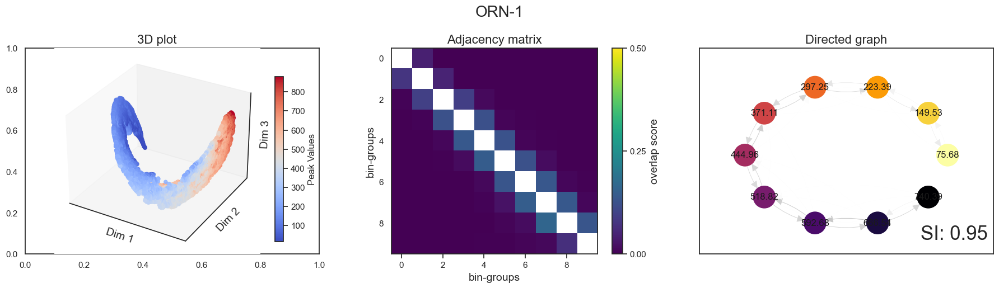

In [227]:
fig, ax = plt.subplots(1, 3, figsize=(18,5))

# plot 3D scatter
# also you can set vmin and vmax to your specific data
at = plt.subplot(1,3,1,projection = '3d')
b = at.scatter(*emb_orn1[:, :3].T, c = np.array(orn1_trials['peak_values']), cmap = 'coolwarm',
               vmin= np.percentile(orn1_trials['peak_values'],1),
               vmax = np.percentile(orn1_trials['peak_values'],99))
cbar = fig.colorbar(b,ax=at,anchor=(0, 0.3), shrink=0.8)
cbar.set_label('Peak Values', rotation=90)
at.set_title(f'3D plot', size=16);
at.set_xlabel('Dim 1', labelpad=-8, size=14)
at.set_ylabel('Dim 2', labelpad=-8, size=14)
at.set_zlabel('Dim 3', labelpad=-8, size=14)
at.set_xticks([])
at.set_yticks([])
at.set_zticks([])

# plot adjacency matrix
b = ax[1].matshow(overlapMat_orn1, vmin = 0, vmax = 0.5, cmap = plt.cm.viridis)
ax[1].xaxis.set_ticks_position('bottom')
cbar = fig.colorbar(b,ax=ax[1],anchor=(0, 0.2), shrink=1, ticks=[0,0.25,0.5])
cbar.set_label('overlap score', rotation=90, fontsize = 14)
ax[1].set_title('Adjacency matrix', size=16);
ax[1].set_xlabel('bin-groups', size=14)
ax[1].set_ylabel('bin-groups', size=14)

# plot weighted directed graph
draw_graph(overlapMat_orn1, ax[2],node_cmap=plt.cm.inferno_r,edge_cmap=plt.cm.Greys,
                                  node_names = np.round(binLabel_orn1[1][:,0,1],2));
ax[2].set_xlim(1.2*np.array(ax[2].get_xlim()));
ax[2].set_ylim(1.2*np.array(ax[2].get_ylim()));
ax[2].set_title('Directed graph', size=16);
ax[2].text(0.98, 0.05, f"SI: {SI_orn1:.2f}", horizontalalignment='right',
     verticalalignment='bottom', transform=ax[2].transAxes,fontsize=25)
fig.suptitle('ORN-1', fontsize=20)
plt.tight_layout()

plt.savefig('orn_1_si.png')

### ORN_3

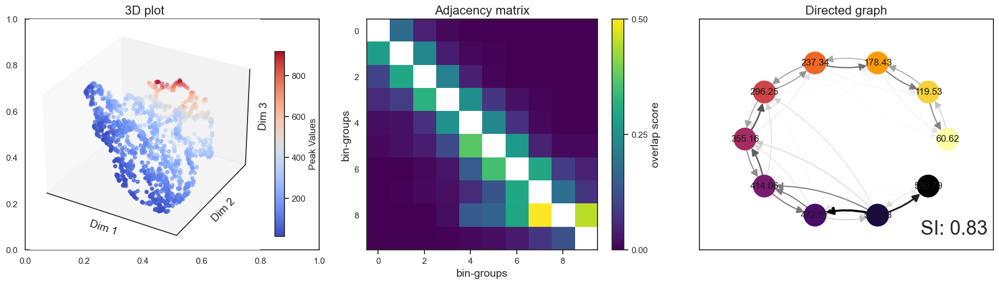

In [157]:
fig, ax = plt.subplots(1, 3, figsize=(18,5))

# plot 3D scatter
# also you can set vmin and vmax to your specific data
at = plt.subplot(1,3,1,projection = '3d')
b = at.scatter(*emb_orn3[:, :3].T, c = np.array(orn3_trials['peak_values']), cmap = 'coolwarm',
               vmin= np.percentile(orn3_trials['peak_values'],1),
               vmax = np.percentile(orn3_trials['peak_values'],99))
cbar = fig.colorbar(b,ax=at,anchor=(0, 0.3), shrink=0.8)
cbar.set_label('Peak Values', rotation=90)
at.set_title(f'3D plot', size=16);
at.set_xlabel('Dim 1', labelpad=-8, size=14)
at.set_ylabel('Dim 2', labelpad=-8, size=14)
at.set_zlabel('Dim 3', labelpad=-8, size=14)
at.set_xticks([])
at.set_yticks([])
at.set_zticks([])

# plot adjacency matrix
b = ax[1].matshow(overlapMat_orn3, vmin = 0, vmax = 0.5, cmap = plt.cm.viridis)
ax[1].xaxis.set_ticks_position('bottom')
cbar = fig.colorbar(b,ax=ax[1],anchor=(0, 0.2), shrink=1, ticks=[0,0.25,0.5])
cbar.set_label('overlap score', rotation=90, fontsize = 14)
ax[1].set_title('Adjacency matrix', size=16);
ax[1].set_xlabel('bin-groups', size=14)
ax[1].set_ylabel('bin-groups', size=14)

# plot weighted directed graph
draw_graph(overlapMat_orn3, ax[2],node_cmap=plt.cm.inferno_r,edge_cmap=plt.cm.Greys,
                                  node_names = np.round(binLabel_orn3[1][:,0,1],2));
ax[2].set_xlim(1.2*np.array(ax[2].get_xlim()));
ax[2].set_ylim(1.2*np.array(ax[2].get_ylim()));
ax[2].set_title('Directed graph', size=16);
ax[2].text(0.98, 0.05, f"SI: {SI_orn3:.2f}", horizontalalignment='right',
     verticalalignment='bottom', transform=ax[2].transAxes,fontsize=25)
plt.tight_layout()

### ORN_4

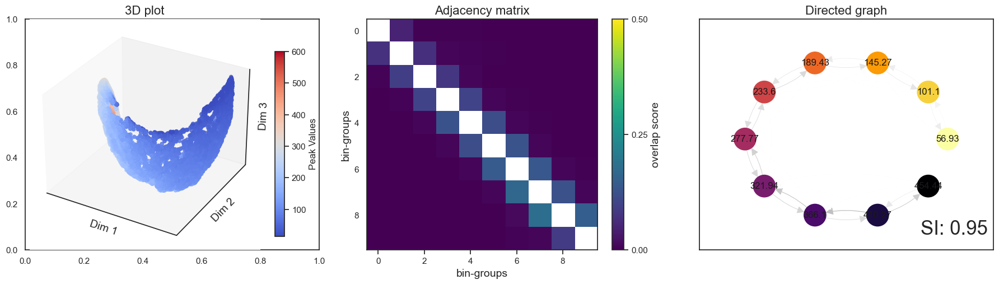

In [159]:
fig, ax = plt.subplots(1, 3, figsize=(18,5))

# plot 3D scatter
# also you can set vmin and vmax to your specific data
at = plt.subplot(1,3,1,projection = '3d')
b = at.scatter(*emb_orn4[:, :3].T, c = np.array(orn4_trials['peak_values']), cmap = 'coolwarm',
               vmin= np.percentile(orn4_trials['peak_values'],1),
               vmax = np.percentile(orn4_trials['peak_values'],99))
cbar = fig.colorbar(b,ax=at,anchor=(0, 0.3), shrink=0.8)
cbar.set_label('Peak Values', rotation=90)
at.set_title(f'3D plot', size=16);
at.set_xlabel('Dim 1', labelpad=-8, size=14)
at.set_ylabel('Dim 2', labelpad=-8, size=14)
at.set_zlabel('Dim 3', labelpad=-8, size=14)
at.set_xticks([])
at.set_yticks([])
at.set_zticks([])

# plot adjacency matrix
b = ax[1].matshow(overlapMat_orn4, vmin = 0, vmax = 0.5, cmap = plt.cm.viridis)
ax[1].xaxis.set_ticks_position('bottom')
cbar = fig.colorbar(b,ax=ax[1],anchor=(0, 0.2), shrink=1, ticks=[0,0.25,0.5])
cbar.set_label('overlap score', rotation=90, fontsize = 14)
ax[1].set_title('Adjacency matrix', size=16);
ax[1].set_xlabel('bin-groups', size=14)
ax[1].set_ylabel('bin-groups', size=14)

# plot weighted directed graph
draw_graph(overlapMat_orn4, ax[2],node_cmap=plt.cm.inferno_r,edge_cmap=plt.cm.Greys,
                                  node_names = np.round(binLabel_orn4[1][:,0,1],2));
ax[2].set_xlim(1.2*np.array(ax[2].get_xlim()));
ax[2].set_ylim(1.2*np.array(ax[2].get_ylim()));
ax[2].set_title('Directed graph', size=16);
ax[2].text(0.98, 0.05, f"SI: {SI_orn4:.2f}", horizontalalignment='right',
     verticalalignment='bottom', transform=ax[2].transAxes,fontsize=25)
plt.tight_layout()

### ORN_6

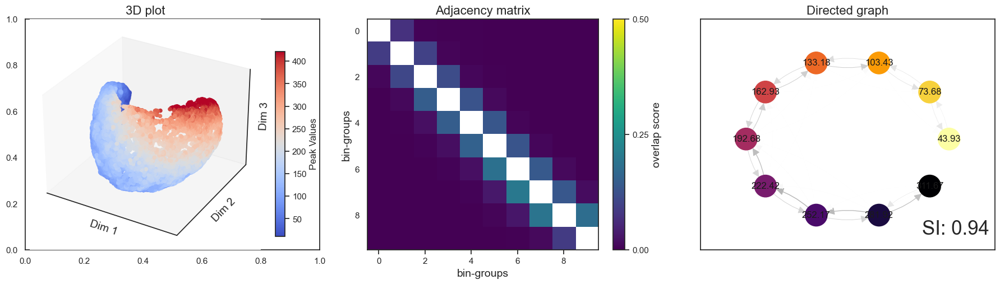

In [161]:
fig, ax = plt.subplots(1, 3, figsize=(18,5))

# plot 3D scatter
# also you can set vmin and vmax to your specific data
at = plt.subplot(1,3,1,projection = '3d')
b = at.scatter(*emb_orn6[:, :3].T, c = np.array(orn6_trials['peak_values']), cmap = 'coolwarm',
               vmin= np.percentile(orn6_trials['peak_values'],1),
               vmax = np.percentile(orn6_trials['peak_values'],99))
cbar = fig.colorbar(b,ax=at,anchor=(0, 0.3), shrink=0.8)
cbar.set_label('Peak Values', rotation=90)
at.set_title(f'3D plot', size=16);
at.set_xlabel('Dim 1', labelpad=-8, size=14)
at.set_ylabel('Dim 2', labelpad=-8, size=14)
at.set_zlabel('Dim 3', labelpad=-8, size=14)
at.set_xticks([])
at.set_yticks([])
at.set_zticks([])

# plot adjacency matrix
b = ax[1].matshow(overlapMat_orn6, vmin = 0, vmax = 0.5, cmap = plt.cm.viridis)
ax[1].xaxis.set_ticks_position('bottom')
cbar = fig.colorbar(b,ax=ax[1],anchor=(0, 0.2), shrink=1, ticks=[0,0.25,0.5])
cbar.set_label('overlap score', rotation=90, fontsize = 14)
ax[1].set_title('Adjacency matrix', size=16);
ax[1].set_xlabel('bin-groups', size=14)
ax[1].set_ylabel('bin-groups', size=14)

# plot weighted directed graph
draw_graph(overlapMat_orn6, ax[2],node_cmap=plt.cm.inferno_r,edge_cmap=plt.cm.Greys,
                                  node_names = np.round(binLabel_orn6[1][:,0,1],2));
ax[2].set_xlim(1.2*np.array(ax[2].get_xlim()));
ax[2].set_ylim(1.2*np.array(ax[2].get_ylim()));
ax[2].set_title('Directed graph', size=16);
ax[2].text(0.98, 0.05, f"SI: {SI_orn6:.2f}", horizontalalignment='right',
     verticalalignment='bottom', transform=ax[2].transAxes,fontsize=25)
plt.tight_layout()

### ORN_13

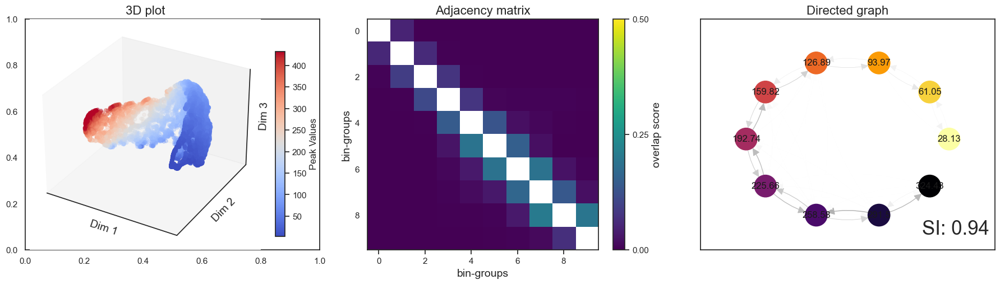

In [163]:
fig, ax = plt.subplots(1, 3, figsize=(18,5))

# plot 3D scatter
# also you can set vmin and vmax to your specific data
at = plt.subplot(1,3,1,projection = '3d')
b = at.scatter(*emb_orn13[:, :3].T, c = np.array(orn13_trials['peak_values']), cmap = 'coolwarm',
               vmin= np.percentile(orn13_trials['peak_values'],1),
               vmax = np.percentile(orn13_trials['peak_values'],99))
cbar = fig.colorbar(b,ax=at,anchor=(0, 0.3), shrink=0.8)
cbar.set_label('Peak Values', rotation=90)
at.set_title(f'3D plot', size=16);
at.set_xlabel('Dim 1', labelpad=-8, size=14)
at.set_ylabel('Dim 2', labelpad=-8, size=14)
at.set_zlabel('Dim 3', labelpad=-8, size=14)
at.set_xticks([])
at.set_yticks([])
at.set_zticks([])

# plot adjacency matrix
b = ax[1].matshow(overlapMat_orn13, vmin = 0, vmax = 0.5, cmap = plt.cm.viridis)
ax[1].xaxis.set_ticks_position('bottom')
cbar = fig.colorbar(b,ax=ax[1],anchor=(0, 0.2), shrink=1, ticks=[0,0.25,0.5])
cbar.set_label('overlap score', rotation=90, fontsize = 14)
ax[1].set_title('Adjacency matrix', size=16);
ax[1].set_xlabel('bin-groups', size=14)
ax[1].set_ylabel('bin-groups', size=14)

# plot weighted directed graph
draw_graph(overlapMat_orn13, ax[2],node_cmap=plt.cm.inferno_r,edge_cmap=plt.cm.Greys,
                                  node_names = np.round(binLabel_orn13[1][:,0,1],2));
ax[2].set_xlim(1.2*np.array(ax[2].get_xlim()));
ax[2].set_ylim(1.2*np.array(ax[2].get_ylim()));
ax[2].set_title('Directed graph', size=16);
ax[2].text(0.98, 0.05, f"SI: {SI_orn13:.2f}", horizontalalignment='right',
     verticalalignment='bottom', transform=ax[2].transAxes,fontsize=25)
plt.tight_layout()

## Feature: mean_if

In [ ]:
SI_orn1, binLabel_orn1, overlapMat_orn1, sSI_orn1 = compute_structure_index(emb_orn1, np.array(orn1_metrics['mean_if']), **params)
SI_orn4, binLabel_orn4, overlapMat_orn4, sSI_orn4 = compute_structure_index(emb_orn4, np.array(orn4_metrics['mean_if']), **params)
SI_orn13, binLabel_orn13, overlapMat_orn13, sSI_orn13 = compute_structure_index(emb_orn13, np.array(orn13_metrics['mean_if']), **params)

In [ ]:
D = {'ORN-1':SI_orn1, 'ORN-4': SI_orn4, 'ORN-13': SI_orn13}

plt.bar(range(len(D)), list(D.values()), align='center')
plt.xticks(range(len(D)), list(D.keys()))
plt.title('Feature: Mean IF');
plt.savefig('meanif_si.png')

## Feature: duration_samples

In [ ]:
SI_orn1, binLabel_orn1, overlapMat_orn1, sSI_orn1 = compute_structure_index(emb_orn1, np.array(orn1_metrics['duration_samples']), **params)
SI_orn4, binLabel_orn4, overlapMat_orn4, sSI_orn4 = compute_structure_index(emb_orn4, np.array(orn4_metrics['duration_samples']), **params)
SI_orn13, binLabel_orn13, overlapMat_orn13, sSI_orn13 = compute_structure_index(emb_orn13, np.array(orn13_metrics['duration_samples']), **params)

In [ ]:
D = {'ORN-1':SI_orn1, 'ORN-4': SI_orn4, 'ORN-13': SI_orn13}

plt.bar(range(len(D)), list(D.values()), align='center')
plt.xticks(range(len(D)), list(D.keys()))
plt.title('Feature: Duration');
plt.savefig('duration_si.png')

## Feature: Peak2Trough

In [ ]:
SI_orn1, binLabel_orn1, overlapMat_orn1, sSI_orn1 = compute_structure_index(emb_orn1, np.array(orn1_metrics['peak2trough']), **params)
SI_orn4, binLabel_orn4, overlapMat_orn4, sSI_orn4 = compute_structure_index(emb_orn4, np.array(orn4_metrics['peak2trough']), **params)
SI_orn13, binLabel_orn13, overlapMat_orn13, sSI_orn13 = compute_structure_index(emb_orn13, np.array(orn13_metrics['peak2trough']), **params)

In [ ]:
D = {'ORN-1':SI_orn1, 'ORN-4': SI_orn4, 'ORN-13': SI_orn13}

plt.bar(range(len(D)), list(D.values()), align='center')
plt.xticks(range(len(D)), list(D.keys()));
plt.savefig('peak2trough.png')